# Plotting Animations of Land Cover <img align="right" src="../Supplementary_data/dea_logo.jpg">

* [**Sign up to the DEA Sandbox**](https://docs.dea.ga.gov.au/setup/sandbox.html) to run this notebook interactively from a browser
* **Compatibility:** Notebook currently compatible with the `DEA Sandbox` environment
* **Products used:** 
[ga_ls_landcover_class_cyear_2](https://explorer.sandbox.dea.ga.gov.au/products/ga_ls_landcover_class_cyear_2)


## Background

Land cover is the observed physical cover on the Earth's surface, including trees, shrubs, grasses, soils, exposed rocks, water bodies, plantations, crops and built structures. Digital Earth Australia Land Cover (DEA Land Cover) is a continental dataset that maps annual land cover classifications for Australia from 1988 to the present. More detailed information about DEA Land Cover can be found in the [DEA Land Cover notebook](../DEA_datasets/DEA_Land_Cover.ipynb) and on the [DEA Land Cover product details](https://cmi.ga.gov.au/data-products/dea/607/dea-land-cover-landsat#details) page.

## Description

Plotting animations of satelite data are a valuble tool for scientific communicating and visualising change over time. This note book introduces the lc_animation fuction and demonstrates how it can be used to visualise and communicate trends in land cover over the 30+ year archive of land cover data.

This notebook demonstrates how to:

1. Load a time series of DEA Land Cover data as an `xarray` dataset
2. Plot land cover as an animation
3. Plot the data as an animation beside a corresponding stacked line plot
4. modifying the way land cover is plotted as an animation

***

### Load Packages

In [1]:
%matplotlib inline

import math
import os
import sys

import datacube
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr

sys.path.insert(1, os.path.abspath("../Tools"))
from dea_tools.land_cover import lc_animation
from dea_tools.plotting import display_map

### Connect to the datacube

In [2]:
dc = datacube.Datacube(app="land_cover_animation")

## Create query and load a time series of Land Cover data

In order to generate animations of DEA Land COver we first need to load a time series of data for an area. As an example let's load both the base 6 class classification (level 3) layer and the full classification (level 4) layer for Lake Wallawalla, A waterbody located in the Murry River Valley in north western Victoria that goes through cycles of drying and filling.

In [3]:
# lake Wallawalla
point_x, point_y = (-34.1795, 141.1937)


lat = (point_x - 0.05, point_x + 0.05)
lon = (point_y - 0.1, point_y + 0.1)

# display area on map
display_map(x=lon, y=lat)

In [4]:
# Build query and load data

query = {
    "y": lat,
    "x": lon,
    "time": ("1988", "2021"),
}

# Load DEA Land Cover data from the datacube
land_cover_data = dc.load(
    product="ga_ls_landcover_class_cyear_2",
    output_crs="EPSG:3577",
    measurements=["level3", "level4", "waterper_wat_cat_l4d_au"],
    resolution=(-25, 25),
    **query
)

In [5]:
# see what we have loaded
land_cover_data

<xarray.Dataset>
Dimensions:                  (time: 33, y: 499, x: 765)
Coordinates:
  * time                     (time) datetime64[ns] 1988-01-01 ... 2020-01-01
  * y                        (y) float64 -3.755e+06 -3.755e+06 ... -3.767e+06
  * x                        (x) float64 8.332e+05 8.333e+05 ... 8.523e+05
    spatial_ref              int32 3577
Data variables:
    level3                   (time, y, x) uint8 111 111 111 111 ... 111 111 111
    level4                   (time, y, x) int8 17 17 17 17 17 ... 34 16 16 16 16
    waterper_wat_cat_l4d_au  (time, y, x) int8 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0
Attributes:
    crs:           EPSG:3577
    grid_mapping:  spatial_ref

## Plot Animation 

### Plot default animation of level 3

lc_animation has a number of option controlling the inclusion on colour bars, tick marks and the inclusion of an animated stacked line plot beside the animated map. To begin however let's plot the level 3 layer with all default options. This will plot a single animated map with tick marks and no colour bar. A copy of the animation will be saved to file as 'default_animation.gif', this name can be changed by providing an alternative as the variable 'file_name' as will be done in following examples.

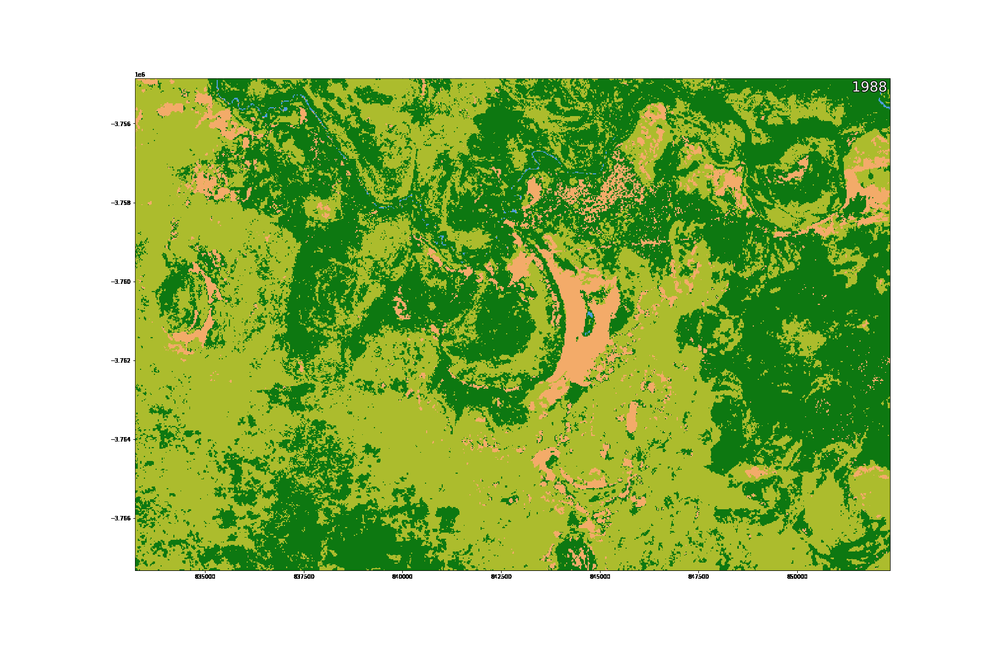

In [6]:
# select level 3
level_3 = land_cover_data["level3"]

# generate plot
lc_animation(level_3)

### Generating an animation with a stacked line plot

when `Stacked_plot` is set to True lc_animation will generat a stacked line plot that is sycronised with the animated map. the stacked line plot shows what percentace of the map is taken up by each class in each year. for this example we will use the full classification, level 4 layer.

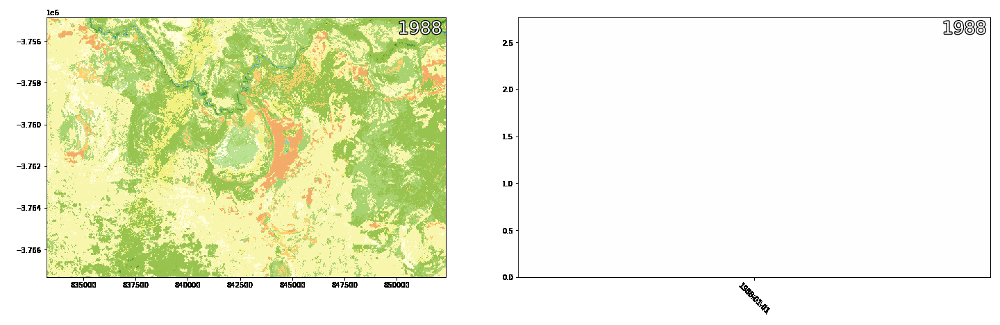

In [7]:
# select level 4
level_4 = land_cover_data["level4"]

# set file name
file_name1 = "level_4_with_stacked_plot"

# generate plot
lc_animation(level_4, file_name=file_name1, stacked_plot=True)

## Modifying lc_animation
 lc_animation contains a lot of obtional peramiter to customise the fuction and apperance of the land cover animations. Below are examples of how some of them opperate. For the full deatils pf the peramiters please reffer to the [Land_cover.py](../Tools/dea_tools/land_cover.py) file


### Plot with colour bar

A colour bar can be added to the stand alone animation by setting the variable `colour_bar` to True. The colour bar does not work with the stacked line plot option. Using a colour bar This is not recomended with the full classification (level 4) layer due to the number of layers level 4 contains. let's generate an examle using the water presistence layer to see how a colour bar can be added.


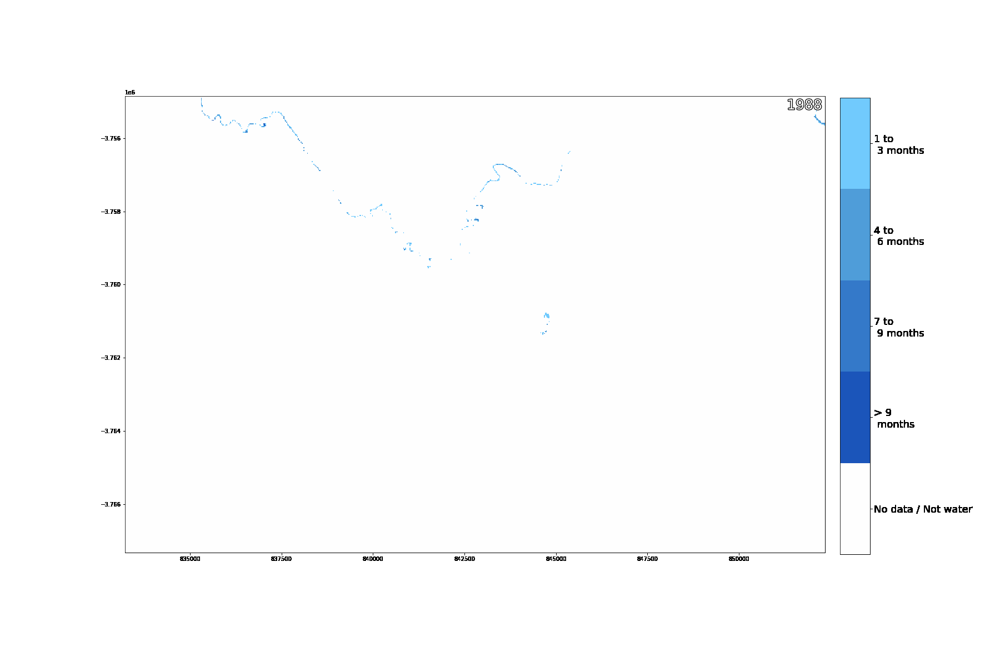

In [8]:
# select water persistance layer
water_per = land_cover_data["waterper_wat_cat_l4d_au"]

# set file name
water_file_name = "water_persistence_animation"

lc_animation(water_per, file_name=water_file_name, colour_bar=True)

### Plot with no axes ticks

if you want to make very pretty for communication purposes, maybe you don't want to have any tick marks on the axes.  

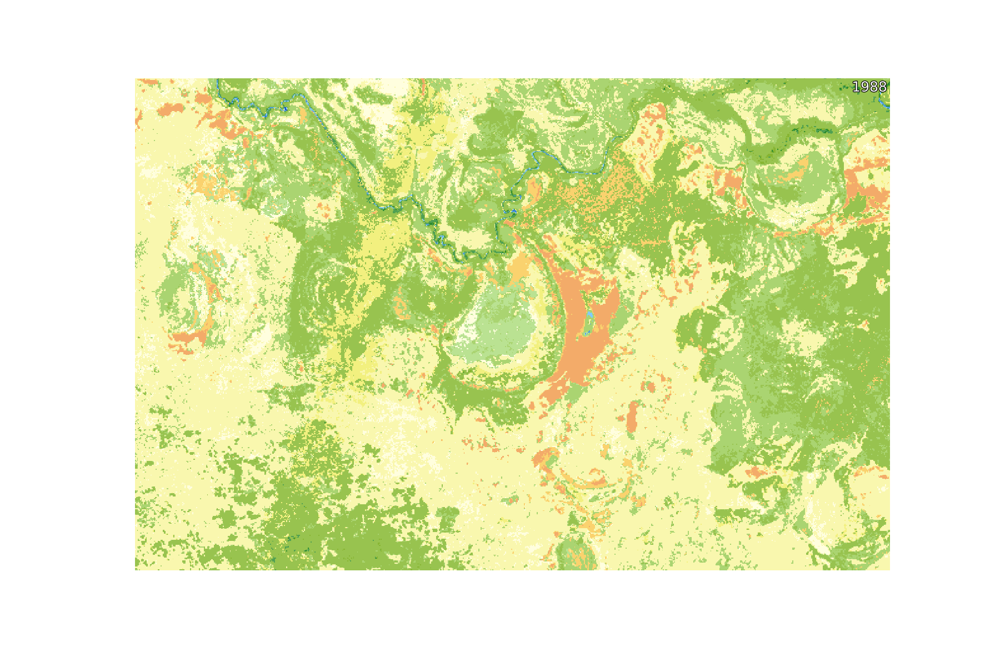

In [9]:
# select level 4
level_4 = land_cover_data["level4"]

# set file name
file_name2 = "level_4_no_ticks_example"

# generate plot
lc_animation(level_4, file_name=file_name2, ticks=False)

### Specifying the layer

The variable 'layer' is optional and only needs to be specified if the data array or datatset being provided has lost the name of the data variable being plotted. In that event `layer` will tell the animation which DEA Land Cover colour map to use. Trying to plot a layer with the incorrect colour map will result in all data being plotted as 'no-data' or will produce an error. 

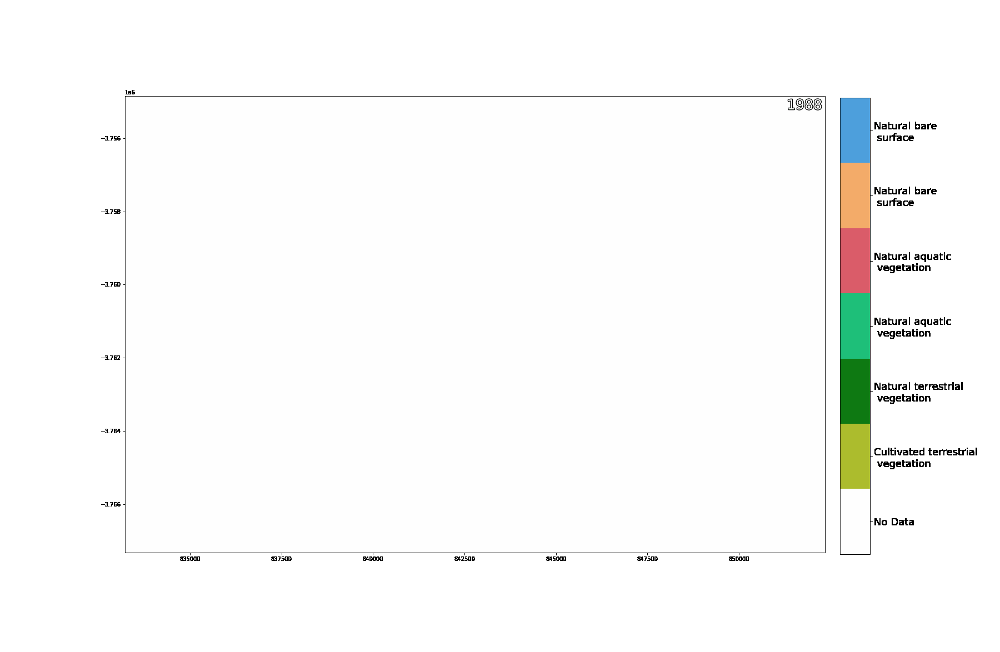

In [10]:
# select level 4
level_4 = land_cover_data["level4"]

# set file name
file_name1 = "missmatched_layers_example"

# generate plot
lc_animation(level_4, layer="Level3", file_name=file_name1, colour_bar=True)